In [2]:
import pandas as pd
import numpy as np

## Exploratory analysis

In [59]:
import pandas as pd
import numpy as np
from urllib.parse import urlparse, parse_qs

CTCODE        = "ct"
QUERY         = "q"
METAFIELDS    = "url_dict"
DATE, REGION, BROWSER, DEVICE, META = "date","region","browser","device","meta"

DOMAIN        = "d"
META_SLD      = "sld"
META_NT       = "nt"
META_R        = "r"
META_ADX      = "adx"
TTC           = "ttc"
SAFE_SEARCH   = "kp"
REGION_DDG    = "kl"
META_ABTS     = "lsexp1"
META_BKL      = "bkl"
META_OM       = "om"
META_ATB      = "atb"

CTCODE_PRC       = "ct_processed"
REGION_DDG_PRC   = "kl_processed"
LENQ             = "no_words_query"
HOUROFDAY        = "hour"
DOMAIN_COUNT     = "d_count"
QUERY_COUNT      = "q_count"
META_BKL_PRC = 'bkl_processed'


REGION_DDG_PRC_MAPPER = {'wt-wt': 'wt-wt',
 'de-de': 'de-de',
 'uk-en': 'uk-en',
 'fr-fr': 'fr-fr',
 'nl-nl': 'nl-nl',
 'es-es': 'es-es',
 'ca-en': 'ca-en',
 'it-it': 'it-it',
 'se-sv': 'se-sv',
 'in-en': 'in-en',
 'br-pt': 'br-pt',
 'no-no': 'no-no',
 'mx-es': 'mx-es',
 'at-de': 'at-de',
 'dk-da': 'dk-da',
 'us-en': 'us-en',
 'fi-fi': 'fi-fi',
 'ca-fr': 'ca-fr',
 'sg-en': 'sg-en'}


CTCDPR_MAPPER = {'DE': 'DE',
 'GB': 'GB',
 'CA': 'CA',
 'FR': 'FR',
 'IT': 'IT',
 'NL': 'NL',
 'ES': 'ES',
 'RU': 'RU',
 'IN': 'IN',
 'SE': 'SE',
 'AU': 'AU',
 'MX': 'MX',
 'BR': 'BR',
 'AT': 'AT',
 'IE': 'IE',
 'UG': 'UG',
 'NO': 'NO',
 'FI': 'FI',
 'SC': 'SC',
 'SG': 'SG'}

df = pd.read_json("datasets/clicks-dataset.json")

df.columns = [DATE, REGION, BROWSER, DEVICE, META]

def extract_url_fields(url):
    qs = parse_qs(urlparse(url).query)
    return {k: v[0] if len(v)==1 else v for k,v in qs.items()}

df[METAFIELDS] = df[META].map(extract_url_fields)

meta = (
    pd.json_normalize(df[METAFIELDS])
      .rename(columns={
          'q':      QUERY,
          'd':      DOMAIN,
          'sld':    META_SLD,
          'nt':     META_NT,
          'r':      META_R,
          'adx':    META_ADX,
          'ttc':    TTC,
          'ct':     CTCODE,
          'kp':     SAFE_SEARCH,
          'kl':     REGION_DDG,
          'lsexp1': META_ABTS,
          'bkl':    META_BKL,
          'om':     META_OM,
          'atb':    META_ATB,
      })
)

meta[QUERY]        = meta[QUERY].fillna("").astype(str)
meta[DOMAIN]       = meta[DOMAIN].fillna("").astype(str)
meta[META_ADX]     = meta[META_ADX].fillna("").astype(str)

for col in (META_SLD, META_NT, META_R, SAFE_SEARCH):
    meta[col] = (
        pd.to_numeric(meta[col], errors="coerce")
          .fillna(-1)
          .astype(int)
    )

meta[TTC]          = pd.to_numeric(meta[TTC], errors="coerce")
meta[META_ABTS]    = meta[META_ABTS].fillna("").astype(str)
meta[META_BKL]     = meta[META_BKL].fillna("").astype(str)
meta[META_OM]      = meta[META_OM].fillna("").astype(str)
meta[META_ATB]     = meta[META_ATB].fillna("").astype(str)

meta[CTCODE_PRC]       = meta[CTCODE].map(CTCDPR_MAPPER).fillna("OTHER")
meta[REGION_DDG_PRC]   = meta[REGION_DDG].map(REGION_DDG_PRC_MAPPER).fillna("OTHER")

meta[LENQ]         = meta[QUERY].str.split().str.len()
df[HOUROFDAY]      = pd.to_datetime(df[DATE]).dt.hour

df = (
    df
    .drop(columns=[METAFIELDS, META])
    .join(meta)
)

In [ ]:
top10 = df[META_BKL].value_counts().sort_values().head(10).index
META_BKL_MAPPER = dict(zip(top10,top10))
META_BKL_MAPPER
df[META_BKL_PRC] = df[META_BKL].map(META_BKL_MAPPER).fillna("OTHER")

In [ ]:
df.columns

Index(['date', 'region', 'browser', 'device', 'hour', 'n', 'f', 'd', 'sld',
       'st', 'nt', 'r', 'adx', 'adx_name', 'ttc', 'q', 'ct', 'kl', 'kp',
       'lsexp1', 'bkl', 'om', 'atb', 'va', 'atbva', 'atbexp', 'ct_processed',
       'kl_processed', 'no_words_query', 'q_count', 'd_count',
       'bkl_processed'],
      dtype='object')

In [ ]:
domains_counts = df[DOMAIN].value_counts().to_dict()
query_counts = df[QUERY].value_counts().to_dict()

df[QUERY_COUNT] = df[QUERY].map(query_counts)
df[DOMAIN_COUNT] = df[DOMAIN].map(domains_counts)
df.head()

,date,region,browser,device,hour,n,f,d,sld,st,...,om,atb,va,atbva,atbexp,ct_processed,kl_processed,no_words_query,q_count,d_count
0,2019-12-02 18:52:42,Earth,Edge,Android,18,1,1,www.amazon.ca,0,mobile_search_intl,...,,,NaN,NaN,NaN,CA,wt-wt,4,1,490
1,2019-12-02 16:30:07,Earth,Edge,Android,16,1,1,regus.ca,0,mobile_search_intl,...,,,NaN,NaN,NaN,CA,wt-wt,4,1,1
2,2019-12-02 13:04:19,Mars,Safari,Android,13,1,1,www.heathrowexpress.com,1,mobile_search_intl,...,,,NaN,NaN,NaN,SE,se-sv,2,2,3
3,2019-12-02 07:35:56,Mars,Chrome,Android,7,1,1,www.heathrowexpress.com,1,mobile_search_intl,...,,,NaN,NaN,NaN,GB,wt-wt,2,2,3
4,2019-12-02 08:59:14,Earth,Chrome,Android,8,1,1,www.greyhound.com,0,mobile_search_intl,...,,,NaN,NaN,NaN,CA,wt-wt,1,1,1


In [ ]:
df['atbexp'].value_counts()

atbexp
uiu    6
Name: count, dtype: int64

In [ ]:
df[TTC].quantile([.95])

0.95    48306.2
Name: ttc, dtype: float64

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def plot_distributions(df, categorical, continuous, ncols=3, figsize=(20, 25)):
    """
    Plots normalized bar plots for categorical columns and histograms (up to 95th percentile)
    for continuous columns in a grid layout.
    """
    total = len(categorical) + len(continuous)
    nrows = int(np.ceil(total / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=figsize,)
    axes = axes.flatten()
    idx = 0
    
    for col in categorical:
        ax = axes[idx]
        df[col].value_counts(normalize=True).sort_index().plot(
            kind='bar', ax=ax, title=f"{col} (proportion)"
        )
        ax.set_xlabel(col)
        ax.set_ylabel("Proportion")
        idx += 1
    
    for col in continuous:
        ax = axes[idx]
        q95 = df[col].quantile(0.95)
        df[col].dropna().loc[lambda x: x <= q95].hist(
            ax=ax, bins=30, edgecolor='black'
        )
        ax.set_title(f"{col} (≤ 95th pct)")
        ax.set_xlabel(col)
        ax.set_ylabel("Count")
        idx += 1
    
    for j in range(idx, len(axes)):
        fig.delaxes(axes[j])
    
    fig.subplots_adjust(wspace=0.4, hspace=1.1)
    plt.show()

categorical_cols = [
    'region', 'browser', 'device', 'hour', 'n', 'kl_processed',  'sld',
    'st', 'nt','bkl_processed' , 'adx', 'adx_name', 'kp', 'lsexp1', 
    'om', 'atb', 'va', 'atbva', 'atbexp', 'ct_processed','r',
    'f', 'no_words_query'
]
continuous_cols = ['ttc', 'q_count', 'd_count']



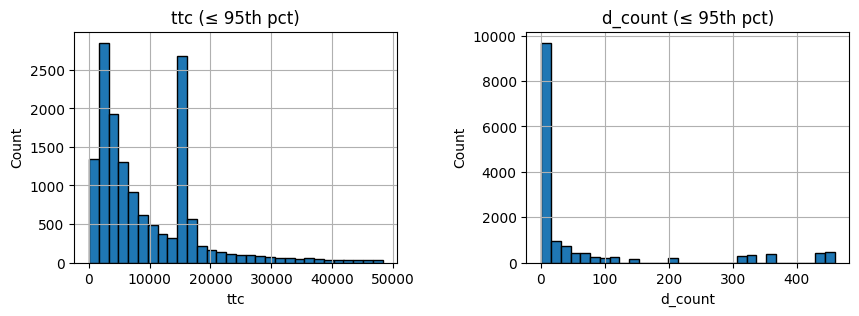

In [62]:

plot_distributions(df, [], ['ttc', 'd_count'], ncols=2, figsize=(10, 3))


In [ ]:
df.to_json('datasets/dataset_preprocessed.json')

## Baseline

In [1]:
import pandas as pd
import numpy as np
from urllib.parse import urlparse, parse_qs

CTCODE        = "ct"
QUERY         = "q"
METAFIELDS    = "url_dict"
DATE, REGION, BROWSER, DEVICE, META = "date","region","browser","device","meta"

DOMAIN        = "d"
META_SLD      = "sld"
META_NT       = "nt"
META_R        = "r"
META_ADX      = "adx"
TTC           = "ttc"
SAFE_SEARCH   = "kp"
REGION_DDG    = "kl"
META_ABTS     = "lsexp1"
META_BKL      = "bkl"
META_OM       = "om"
META_ATB      = "atb"

CTCODE_PRC       = "ct_processed"
REGION_DDG_PRC   = "kl_processed"
LENQ             = "no_words_query"
HOUROFDAY        = "hour"
DOMAIN_COUNT     = "d_count"
QUERY_COUNT      = "q_count"
META_BKL_PRC = 'bkl_processed'

PVAL_QUERY = 'pval_dup_count_query'
DELTA_DENSITY_TTC = 'delta_density_ttc_bin'
BINNED_TTC = 'binned_ttc'
df = pd.read_json('datasets/dataset_preprocessed.json')

In [12]:
df[df[TTC]<500][[DEVICE,REGION,BROWSER]].value_counts(normalize=True)

device   region   browser  
Android  Mars     Chrome       0.333333
         Earth    Chrome       0.175758
         Mars     Edge         0.121212
                  Safari       0.060606
         Venus    Chrome       0.054545
         Mars     UCBrowser    0.054545
         Mercury  Chrome       0.042424
         Saturn   Chrome       0.036364
iOS      Mars     Brave        0.030303
Android  Jupiter  Chrome       0.024242
         Venus    Edge         0.018182
         Earth    UCBrowser    0.012121
         Saturn   Edge         0.012121
         Earth    Edge         0.006061
         Mercury  Edge         0.006061
         Earth    Safari       0.006061
iOS      Earth    Brave        0.006061
Name: proportion, dtype: float64

In [13]:
df[df[TTC]>500][[DEVICE,REGION,BROWSER]].value_counts(normalize=True)

device   region   browser  
Android  Mars     Chrome       0.264455
         Earth    Chrome       0.238262
         Mars     Edge         0.140150
                  Safari       0.072630
                  UCBrowser    0.044432
iOS      Mars     Brave        0.034084
Android  Earth    Edge         0.026775
         Saturn   Chrome       0.024253
         Mercury  Chrome       0.020243
         Earth    Safari       0.016880
         Venus    Chrome       0.015587
iOS      Mars     Safari       0.012288
Android  Jupiter  Chrome       0.011835
iOS      Mars     Chrome       0.009895
         Earth    Brave        0.008214
Android  Venus    Edge         0.007826
         Earth    UCBrowser    0.006661
         Jupiter  Edge         0.006209
         Mercury  Edge         0.004463
         Saturn   Edge         0.004075
iOS      Earth    Safari       0.003104
Android  Venus    Safari       0.002975
iOS      Venus    Brave        0.002975
Android  Jupiter  Safari       0.002587
iOS      Jup

In [ ]:
import os
import pandas as pd

def parse_aol_log(fn):
    results = []
    with open(fn, encoding='utf8') as f:
        block = []
        for line in f:
            line = line.strip()
            if not line and block:
                q, d = block[0].split('\t', 1)
                results.append((q, d))
                block = []
            elif line:
                block.append(line)
        if block:
            q, d = block[0].split('\t', 1)
            results.append((q, d))
    return results

raw = []
for fn in os.listdir('user_search_logs'):
    raw += parse_aol_log(f'user_search_logs/{fn}')

aol = pd.DataFrame(raw, columns=[QUERY, DATE])
aol[DATE] = pd.to_datetime(aol[DATE])
aol = aol.sort_values(DATE).tail(len(df))

aol = (
    aol[QUERY]
      .value_counts()
      .rename_axis(QUERY)
      .reset_index(name=QUERY_COUNT)
)

# bucket “length of query” up to 6
LENQ_PRC = f'processed_{LENQ}'
aol[LENQ_PRC] = (
    aol[QUERY]
      .str.split()
      .str.len()
      .clip(upper=6)
)


In [4]:
df[LENQ_PRC] = df[LENQ].clip(upper=6)
df = df[df[LENQ]>0].reset_index(drop=True)

In [ ]:
import numpy as np

quantiles = {}
for k in range(1, 7):
    vals = aol[aol[LENQ_PRC] == k][QUERY_COUNT]
    quantiles[k] = (
        vals.quantile(np.linspace(0, 1, 101)).values
        if len(vals) else
        None
    )

def pval(num_words, dup_count):
    q = quantiles.get(num_words)
    if q is None:
        return np.nan
    cdf = np.mean(q <= dup_count)
    return 1 - cdf

df[PVAL_QUERY] = df.apply(lambda x: pval(x[LENQ_PRC],x[QUERY_COUNT]),axis=1)


Example p-value: 0.07920792079207917


In [ ]:
from scipy import stats

ttc_data = df[TTC].values

s, loc, scale = stats.lognorm.fit(ttc_data[ttc_data<df[TTC].quantile(.99)])

bins = np.append(np.linspace(min(ttc_data), df[TTC].quantile(.99), 300),df[TTC].max())
bin_centers = (bins[:-1] + bins[1:]) / 2
bin_width = bins[1] - bins[0]

hist, _ = np.histogram(ttc_data, bins=bins, density=True)
actual_density = hist * bin_width

expected_density = stats.lognorm.pdf(bin_centers, s, loc=loc, scale=scale) * bin_width

result_df = pd.DataFrame({
    'bin_start': bins[:-1],
    'bin_end': bins[1:],
    'actual_density': actual_density,
    'expected_density': expected_density,
    DELTA_DENSITY_TTC : actual_density - expected_density
})


intervals = pd.IntervalIndex.from_arrays(result_df["bin_start"], result_df["bin_end"], closed="left")
df[BINNED_TTC] = intervals.get_indexer(df[TTC].values)
df = result_df.reset_index().rename(columns={"index":BINNED_TTC})[[BINNED_TTC,"expected_density","actual_density",DELTA_DENSITY_TTC]].merge(df )

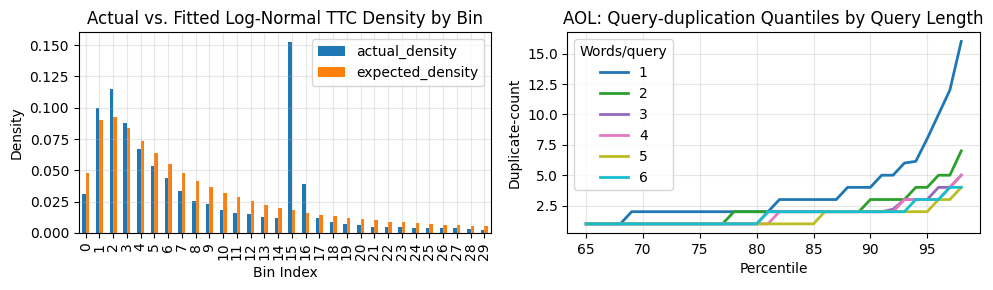

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

df1 = result_df.head(30)[['actual_density', 'expected_density']]

dfq = pd.DataFrame(quantiles)
sub = dfq.iloc[65:99]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(10, 3))

df1.plot.bar(ax=ax1)
ax1.set_title('Actual vs. Fitted Log‑Normal TTC Density by Bin')
ax1.set_xlabel('Bin Index')
ax1.set_ylabel('Density')
ax1.grid(alpha=0.3)

sub.plot(ax=ax2, linewidth=2, colormap='tab10')
ax2.set_title('AOL: Query‑duplication Quantiles by Query Length')
ax2.set_xlabel('Percentile')
ax2.set_ylabel('Duplicate‑count')
ax2.legend(title='Words/query', loc='upper left')
ax2.grid(alpha=0.3)

plt.tight_layout()
plt.show()


In [12]:
df[[DELTA_DENSITY_TTC,PVAL_QUERY]].corr()

,delta_density_ttc_bin,pval_dup_count_query
delta_density_ttc_bin,1.000000,-0.435637
pval_dup_count_query,-0.435637,1.000000


In [52]:
df[f'binned_abs{DELTA_DENSITY_TTC}'] = pd.qcut(df[DELTA_DENSITY_TTC].abs(),[0,.35,.7,1])

In [70]:
df[[QUERY,QUERY_COUNT,LENQ,TTC,'expected_density','actual_density',DELTA_DENSITY_TTC,PVAL_QUERY]].sample(4).round(4).to_dict('records')

[{'q': 'pogonias motorcab',
  'q_count': 1,
  'no_words_query': 2,
  'ttc': 6207,
  'expected_density': 0.0554,
  'actual_density': 0.0442,
  'delta_density_ttc_bin': -0.0112,
  'pval_dup_count_query': 0.2277},
 {'q': 'henries',
  'q_count': 1,
  'no_words_query': 1,
  'ttc': 306,
  'expected_density': 0.0477,
  'actual_density': 0.0314,
  'delta_density_ttc_bin': -0.0164,
  'pval_dup_count_query': 0.3168},
 {'q': 'blade m hd',
  'q_count': 2,
  'no_words_query': 3,
  'ttc': 1062,
  'expected_density': 0.0905,
  'actual_density': 0.1002,
  'delta_density_ttc_bin': 0.0097,
  'pval_dup_count_query': 0.0891},
 {'q': 'condiddle spondaize',
  'q_count': 1,
  'no_words_query': 2,
  'ttc': 527,
  'expected_density': 0.0477,
  'actual_density': 0.0314,
  'delta_density_ttc_bin': -0.0164,
  'pval_dup_count_query': 0.2277}]

In [65]:
df[df[QUERY]=='gladdest dekko pylorus icings embar']

,binned_ttc,expected_density,actual_density,delta_density_ttc_bin,date,region,browser,device,hour,n,...,ct_processed,kl_processed,no_words_query,q_count,d_count,bkl_processed,processed_no_words_query,pval_dup_count_query,binned_absdelta_density_ttc_bin,ttc_bin
15256,96,0.000211,0.000192,-0.000019,2019-12-02 07:09:59,Mars,Chrome,Android,7,1,...,FR,fr-fr,5,1,145,OTHER,5,0.148515,"(-0.000999935, 0.00968]",low ΔTTC


/var/folders/0r/3xlr8_x50pq2pg_6hdz7b0w40000gn/T/ipykernel_2247/2542098821.py:8: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  mean_pdup = df.groupby('ttc_bin')[PVAL_QUERY].mean()


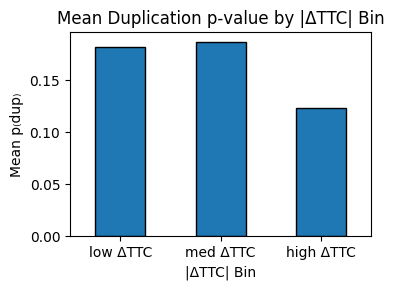

In [ ]:
import matplotlib.pyplot as plt

df['ttc_bin'] = pd.qcut(df[DELTA_DENSITY_TTC].abs(), [0, .33, .66, 1],
                        labels=['low ΔTTC', 'med ΔTTC', 'high ΔTTC'])

mean_pdup = df.groupby('ttc_bin')[PVAL_QUERY].mean()

ax = mean_pdup.plot.bar(
    figsize=(4, 3),
    rot=0,
    edgecolor='k'
)
ax.set_title('Mean Duplication p‑value by |ΔTTC| Bin', )
ax.set_xlabel('|ΔTTC| Bin')
ax.set_ylabel('Mean p₍dup₎')
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import entropy

def norm_entropy(pmf):
    return entropy(pmf) / np.log(len(pmf))

def total_variation(p, q):
    all_idx = p.index.union(q.index)
    p = p.reindex(all_idx, fill_value=0)
    q = q.reindex(all_idx, fill_value=0)
    return 0.5 * np.abs(p - q).sum()

def grid_search_thresholds(
    df, pval_col, delta_col, covariates,
    pval_thresholds, delta_thresholds
):
    results = []
    for τp in pval_thresholds:
        for τδ in delta_thresholds:
            mask = (df[pval_col] < τp) & (df[delta_col].abs() > τδ)
            bots    = df[mask]
            nonbots = df[~mask]

            ent_list = []
            tv_list  = []
            for cov in covariates:
                p_bot = bots[cov].value_counts(normalize=True)
                p_non = nonbots[cov].value_counts(normalize=True)
                ent_list.append(norm_entropy(p_bot) if len(p_bot)>1 else 0.0)
                tv_list.append(total_variation(p_bot, p_non))

            results.append({
                'pval_thr':        τp,
                'delta_thr':       τδ,
                'avg_norm_entropy': np.mean(ent_list),
                'avg_TV_dist':      np.mean(tv_list),
                'bot_rate':         mask.mean(),
                'bot_TTC_std':      bots[TTC].std()
            })

    return pd.DataFrame(results)

pval_thresholds  = df[PVAL_QUERY].quantile(np.linspace(0, 0.4, 40)).values
delta_thresholds = df[DELTA_DENSITY_TTC].abs().quantile(np.linspace(0.5, 1, 40)).values

covariates = [REGION , BROWSER , REGION_DDG_PRC, HOUROFDAY, DEVICE, META_BKL_PRC, CTCODE_PRC ,SAFE_SEARCH ] 

grid_df = grid_search_thresholds(
    df, PVAL_QUERY, DELTA_DENSITY_TTC, covariates,
    pval_thresholds, delta_thresholds
).dropna(subset='bot_TTC_std')

grid_df['score'] = 0.5*grid_df['avg_TV_dist'] + 0.5*(1 - grid_df['avg_norm_entropy'])

best = grid_df.sort_values('score',ascending=False).iloc[0]
print(best)


pval_thr              0.009901
delta_thr             0.023224
avg_norm_entropy      0.190280
avg_TV_dist           0.296809
bot_rate              0.020417
bot_TTC_std         187.349990
score                 0.553264
Name: 346, dtype: float64


In [136]:
grid_df.dropna(subset='bot_TTC_std').to_json("datasets/grid_search_baseline.json")

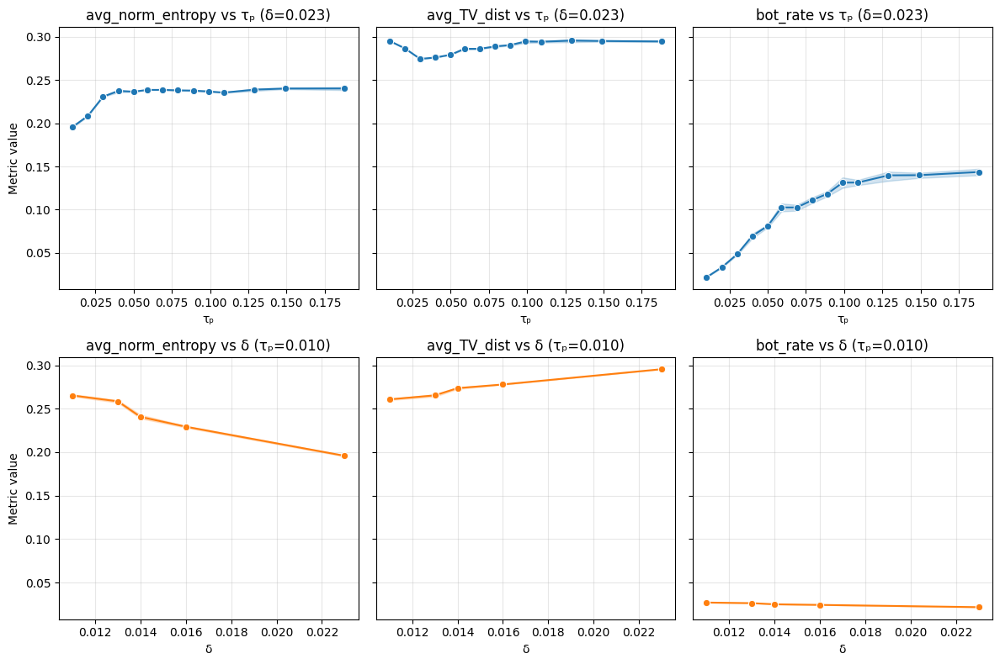

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

clean = (
    grid_df
    .dropna(subset=['bot_TTC_std'])
    .round({'pval_thr': 3, 'delta_thr': 3})
)

best = clean.loc[clean['score'].idxmax()]
opt_p, opt_d = best['pval_thr'], best['delta_thr']

metrics = ['avg_norm_entropy', 'avg_TV_dist', 'bot_rate']
fig, axes = plt.subplots(2, 3, figsize=(12, 8), sharey='row')

# δ fixed, vary τₚ
top = clean[clean['delta_thr'] == opt_d]
for i, m in enumerate(metrics):
    ax = axes[0, i]
    sns.lineplot(data=top, x='pval_thr', y=m, ax=ax, marker='o')
    ax.set_title(f"{m} vs τₚ (δ={opt_d:.3f})")
    ax.set_xlabel("τₚ")
    ax.grid(alpha=0.3)

#  τₚ fixed, vary δ
bot = clean[clean['pval_thr'] == opt_p]
for i, m in enumerate(metrics):
    ax = axes[1, i]
    sns.lineplot(data=bot, x='delta_thr', y=m, ax=ax, marker='o', color='C1')
    ax.set_title(f"{m} vs δ (τₚ={opt_p:.3f})")
    ax.set_xlabel("δ")
    ax.grid(alpha=0.3)

axes[0, 0].set_ylabel("Metric value")
axes[1, 0].set_ylabel("Metric value")
plt.tight_layout()
plt.show()


In [138]:
print(best)

pval_thr              0.010000
delta_thr             0.023000
avg_norm_entropy      0.190280
avg_TV_dist           0.296809
bot_rate              0.020417
bot_TTC_std         187.349990
score                 0.553264
Name: 185, dtype: float64


In [139]:
BASELINE_LABEL = 'baseline_label'
df[BASELINE_LABEL]=(df[PVAL_QUERY]<.01)&(df[DELTA_DENSITY_TTC].abs()>.023)

In [112]:
df.drop(['ttc_bin','binned_absdelta_density_ttc_bin'],axis=1,inplace=True)

In [153]:
covariates

['region',
 'browser',
 'kl_processed',
 'hour',
 'device',
 'bkl_processed',
 'ct_processed',
 'kp']

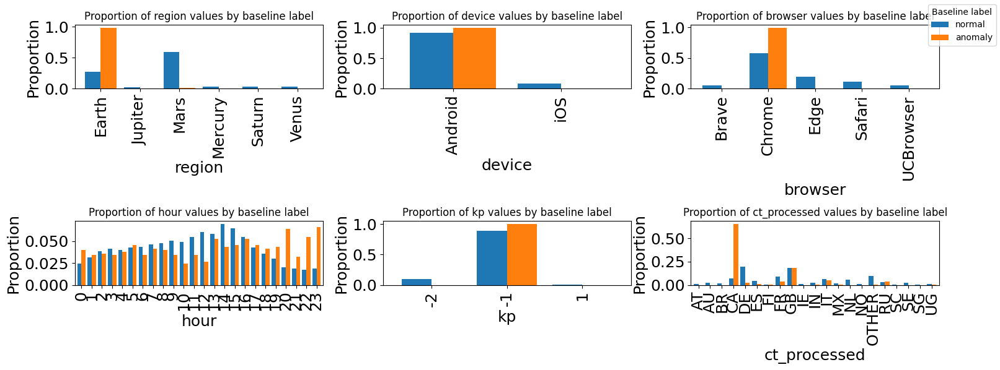

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

covariates = [REGION, DEVICE, BROWSER, HOUROFDAY, SAFE_SEARCH, CTCODE_PRC]

fig, axes = plt.subplots(2, 3, figsize=(16, 6))
axes = axes.flatten()

for ax, cov in zip(axes, covariates):
    pct = pd.crosstab(df[cov], df[BASELINE_LABEL], normalize='columns')
    pct.columns = ['normal','anomaly']
    pct = pct.sort_index()
    pct.plot(
        kind='bar', ax=ax,
        color=['C0','C1'], legend=False, width=0.8
    )
    ax.set_ylabel('Proportion')
    ax.set_xlabel(cov)
    ax.set_title(f'Proportion of {cov} values by baseline label')

for ax in axes[len(covariates):]:
    ax.axis('off')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', title='Baseline label')

plt.rcParams.update({'axes.labelsize': 14, 'xtick.labelsize': 12, 'ytick.labelsize': 12})

plt.tight_layout(rect=[0, 0, 0.95, 1])
plt.show()



In [165]:
df.to_json("datasets/df_with_baseline.json")

## ML 


### Model fit

In [2]:
import pandas as pd
import numpy as np

CTCODE        = "ct"
QUERY         = "q"
METAFIELDS    = "url_dict"
DATE, REGION, BROWSER, DEVICE, META = "date","region","browser","device","meta"

DOMAIN        = "d"
META_SLD      = "sld"
META_NT       = "nt"
META_R        = "r"
META_ADX      = "adx"
TTC           = "ttc"
SAFE_SEARCH   = "kp"
REGION_DDG    = "kl"
META_ABTS     = "lsexp1"
META_BKL      = "bkl"
META_OM       = "om"
META_ATB      = "atb"

CTCODE_PRC       = "ct_processed"
REGION_DDG_PRC   = "kl_processed"
LENQ             = "no_words_query"
HOUROFDAY        = "hour"
DOMAIN_COUNT     = "d_count"
QUERY_COUNT      = "q_count"
META_BKL_PRC = 'bkl_processed'

PVAL_QUERY = 'pval_dup_count_query'
DELTA_DENSITY_TTC = 'delta_density_ttc_bin'
BINNED_TTC = 'binned_ttc'
BASELINE_LABEL = 'baseline_label'
IF_LABEL='if_label'

df = pd.read_json("datasets/df_with_baseline.json")



In [2]:
dfml = df.copy()
cols = [ CTCODE, META_SLD , META_NT , META_R , META_ADX , BINNED_TTC,SAFE_SEARCH,REGION_DDG , REGION,META_BKL,META_OM]


for col in cols:
    dfml[col]=dfml[col].fillna('OTHER')
    norm_counts = dfml[col].value_counts(normalize=True)
    dfml[f'encoded_{col}_count'] = dfml[col].map(norm_counts)


In [ ]:
import numpy as np
import pandas as pd
from scipy.stats import entropy
from sklearn.ensemble import IsolationForest
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

def norm_entropy(probs):
    return entropy(probs, base=np.e) / np.log(len(probs)) if len(probs) > 1 else 0.0

def total_variation(p, q):
    return 0.5 * np.abs(p - q).sum()

def evaluate_iforest_run(
    scores, q, X, df, covariates, seeds,
    pval_col, delta_col, fs_name,
    n_estimators, max_samples, max_features, bootstrap
):
    df = df.reset_index(drop=True)
    thr = np.quantile(scores, q)
    mask = scores < thr
    result = {
        'feature_set': fs_name,
        'n_estimators': n_estimators,
        'max_samples': max_samples,
        'max_features': max_features,
        'bootstrap': bootstrap,
        'quantile': q,
        'bot_rate': float(mask.mean())
    }
    # entropy & TV
    ents, tvs = [], []
    for cov in covariates:
        pos = df.loc[mask, cov].value_counts(normalize=True)
        neg = df.loc[~mask, cov].value_counts(normalize=True)
        idx = pos.index.union(neg.index)
        p = pos.reindex(idx, fill_value=0).values
        r = neg.reindex(idx, fill_value=0).values
        ents.append(norm_entropy(p))
        tvs.append(total_variation(p, r))
    result.update({
        'avg_entropy': float(np.mean(ents)),
        'avg_TV_dist': float(np.mean(tvs))
    })
    # KMeans intersection
    km = KMeans(n_clusters=2, random_state=42).fit(X)
    centers = [scores[km.labels_ == c].mean() for c in (0, 1)]
    anom_cl = int(np.argmin(centers))
    km_mask = km.labels_ == anom_cl
    result['kmeans_intersection'] = float((mask & km_mask).sum()) / mask.sum() if mask.sum() else np.nan
    # silhouette
    try:
        result['silhouette'] = silhouette_score(X, mask.astype(int))
    except:
        result['silhouette'] = np.nan
    # disagreement
    dis = []
    for sd in seeds:
        if2 = IsolationForest(
            contamination='auto', n_estimators=n_estimators,
            max_samples=max_samples, max_features=max_features,
            bootstrap=bootstrap, random_state=int(sd)
        ).fit(X)
        dis_mask = if2.score_samples(X) < thr
        dis.append(np.mean(dis_mask != mask))
    result['disagreement'] = float(np.mean(dis))
    # pval & delta means
    df_pos = df.loc[mask, pval_col]
    df_neg = df.loc[~mask, pval_col]
    result['avg_pval_pos']  = float(df_pos.mean()) if not df_pos.empty else np.nan
    result['avg_pval_neg']  = float(df_neg.mean()) if not df_neg.empty else np.nan
    df_del_pos = df.loc[mask, delta_col]
    df_del_neg = df.loc[~mask, delta_col]
    result['avg_delta_pos'] = float(df_del_pos.mean())  if not df_del_pos.empty else np.nan
    result['avg_delta_neg'] = float(df_del_neg.mean())  if not df_del_neg.empty else np.nan
    return result

def grid_search_iforest(
    df, feature_spaces, covariates,
    pval_col, delta_col, n_runs,
    quantiles,
    param_grid
):
    print("Total jobs:", np.product([len(v) for v in param_grid.values()]) * len(feature_spaces) * len(quantiles) * n_runs)

    seeds = np.random.RandomState(0).randint(0, 10_000, size=n_runs)
    results = []
    for fs_name, feats in feature_spaces.items():
        X = df[feats].values
        for ne in param_grid['n_estimators']:
            for ms in param_grid['max_samples']:
                for mf in param_grid['max_features']:
                    for bt in param_grid['bootstrap']:
                        if_ref = IsolationForest(
                            contamination='auto', n_estimators=ne,
                            max_samples=ms, max_features=mf,
                            bootstrap=bt, random_state=42
                        ).fit(X)
                        scores = if_ref.score_samples(X)
                        for q in quantiles:
                            print(f"→ fs={fs_name}, n_estimators={ne}, max_samples={ms}, max_features={mf}, bootstrap={bt}, quantile={q}")
                            results.append(evaluate_iforest_run(
                                scores, q, X, df, covariates, seeds,
                                pval_col, delta_col, fs_name,
                                ne, ms, mf, bt
                            ))
    return pd.DataFrame(results)

feature_spaces = {
    'with_priors': [
        PVAL_QUERY,DELTA_DENSITY_TTC,
        QUERY_COUNT , DOMAIN_COUNT , 'encoded_binned_ttc_count', 'encoded_kp_count', 
       'encoded_region_count', 'encoded_bkl_count', 'encoded_om_count',
        HOUROFDAY , LENQ,
    ],
    'no_priors': [
        QUERY_COUNT , DOMAIN_COUNT , 'encoded_binned_ttc_count', 'encoded_kp_count', 
       'encoded_region_count', 'encoded_bkl_count', 'encoded_om_count',
        HOUROFDAY , LENQ,
    ],
    'only_counts': [
        DOMAIN_COUNT,QUERY_COUNT,
        'actual_density',
        'encoded_ct_count', 'encoded_sld_count',
       'encoded_nt_count', 'encoded_r_count', 'encoded_adx_count',
       'encoded_binned_ttc_count', 'encoded_kp_count', 'encoded_kl_count',
       'encoded_region_count', 'encoded_bkl_count', 'encoded_om_count'
    ]
}
param_grid = {
            'n_estimators': [1000],#[1000, 5000],
            'max_samples':  [500,1000,2000],#[300, 1000,3000],
            'max_features': [.1,.2,.7],#[0.1, 0.5, 0.8],
            'bootstrap':    [True],
        }
covariates = [REGION , BROWSER , HOUROFDAY, DEVICE, META_BKL_PRC, CTCODE_PRC ,SAFE_SEARCH , META_OM ] 

df_results = grid_search_iforest(
    dfml,
    feature_spaces=feature_spaces,
    covariates=covariates,
    pval_col=PVAL_QUERY,
    delta_col=DELTA_DENSITY_TTC,
    quantiles=(0.02, 0.05, 0.07),
    n_runs=2,
    param_grid=param_grid
)


Total jobs: 162
→ fs=with_priors, n_estimators=1000, max_samples=500, max_features=0.1, bootstrap=True, quantile=0.02
→ fs=with_priors, n_estimators=1000, max_samples=500, max_features=0.1, bootstrap=True, quantile=0.05
→ fs=with_priors, n_estimators=1000, max_samples=500, max_features=0.1, bootstrap=True, quantile=0.07
→ fs=with_priors, n_estimators=1000, max_samples=500, max_features=0.2, bootstrap=True, quantile=0.02
→ fs=with_priors, n_estimators=1000, max_samples=500, max_features=0.2, bootstrap=True, quantile=0.05
→ fs=with_priors, n_estimators=1000, max_samples=500, max_features=0.2, bootstrap=True, quantile=0.07
→ fs=with_priors, n_estimators=1000, max_samples=500, max_features=0.7, bootstrap=True, quantile=0.02
→ fs=with_priors, n_estimators=1000, max_samples=500, max_features=0.7, bootstrap=True, quantile=0.05
→ fs=with_priors, n_estimators=1000, max_samples=500, max_features=0.7, bootstrap=True, quantile=0.07
→ fs=with_priors, n_estimators=1000, max_samples=1000, max_feature

In [10]:
df_results['agg_score'] = (df_results['avg_TV_dist']+(1-df_results['avg_entropy']))/2

In [24]:
df_results.to_json('datasets/grid_search_iforst.json')

In [5]:
df_results.sample().to_dict('records')

[{'feature_set': 'no_priors',
  'n_estimators': 1000,
  'max_samples': 2000,
  'max_features': 0.7000000000000001,
  'bootstrap': True,
  'quantile': 0.02,
  'bot_rate': 0.0200332821,
  'avg_entropy': 0.6602684713,
  'avg_TV_dist': 0.1902837245,
  'kmeans_intersection': 0.6485623003000001,
  'silhouette': 0.5528005994,
  'disagreement': 0.0027201741,
  'avg_pval_pos': 0.052889634000000005,
  'avg_pval_neg': 0.1655743525,
  'avg_delta_pos': 0.0050075746,
  'avg_delta_neg': 0.021342821600000002,
  'agg_score': 0.2650076266}]

In [ ]:
df['max_samp']

array([1000])

/var/folders/0r/3xlr8_x50pq2pg_6hdz7b0w40000gn/T/ipykernel_5592/1701109637.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=param, y=metric, data=df_results.round(3), ax=ax, palette='muted')
/var/folders/0r/3xlr8_x50pq2pg_6hdz7b0w40000gn/T/ipykernel_5592/1701109637.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=param, y=metric, data=df_results.round(3), ax=ax, palette='muted')
/var/folders/0r/3xlr8_x50pq2pg_6hdz7b0w40000gn/T/ipykernel_5592/1701109637.py:20: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(x=param, y=metri

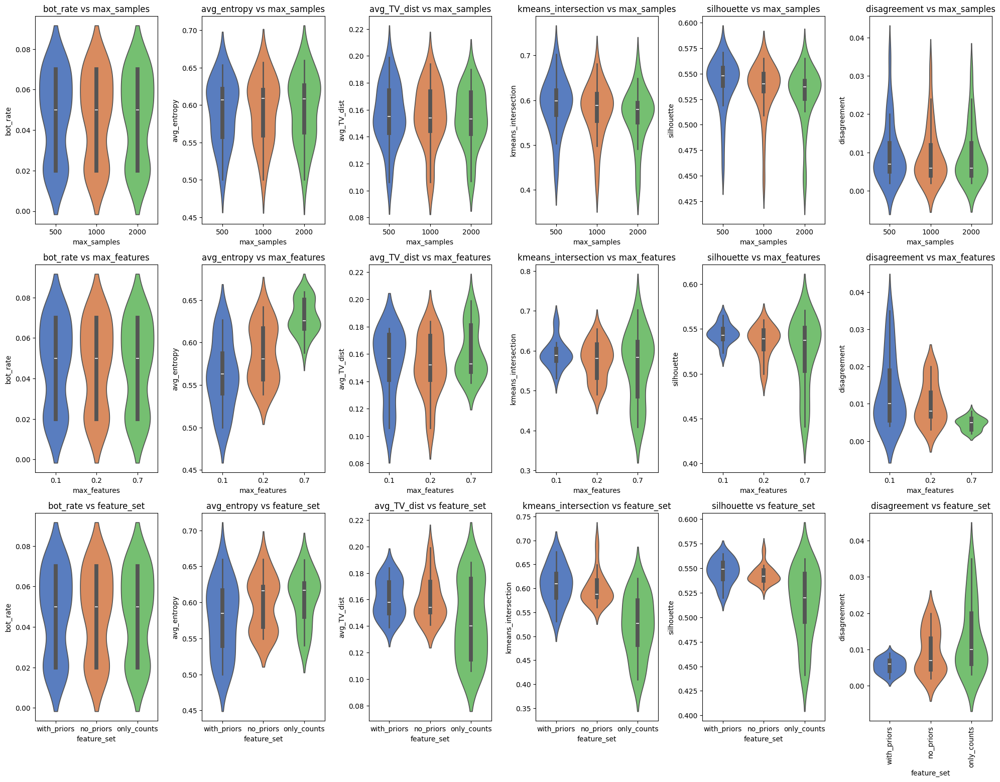

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

metrics = ['bot_rate', 'avg_entropy', 'avg_TV_dist', 'kmeans_intersection', 'silhouette', 'disagreement']

params = ['max_samples', 'max_features', 'feature_set']

fig, axes = plt.subplots(len(params), len(metrics), figsize=(20, 15))
axes = axes.flatten()

for i, param in enumerate(params):
    for j, metric in enumerate(metrics):
        ax = axes[i * len(metrics) + j]
        
        sns.violinplot(x=param, y=metric, data=df_results.round(3), ax=ax, palette='muted')
        
        ax.set_title(f'{metric} vs {param}')
        ax.set_xlabel(param)
        ax.set_ylabel(metric)

plt.tight_layout()
plt.xticks(rotation=90)
plt.show()


In [22]:
dict_rez=  df_results.sort_values('agg_score',ascending=False).head(30).head(1).round(4).to_dict('records')[0]

In [25]:
dict_rez['feature_set']= [
        PVAL_QUERY,DELTA_DENSITY_TTC,
        QUERY_COUNT , DOMAIN_COUNT , 'encoded_binned_ttc_count', 'encoded_kp_count', 
       'encoded_region_count', 'encoded_bkl_count', 'encoded_om_count',
        HOUROFDAY , LENQ,
    ]

In [122]:
dict_rez

{'feature_set': ['pval_dup_count_query',
  'delta_density_ttc_bin',
  'q_count',
  'd_count',
  'encoded_binned_ttc_count',
  'encoded_kp_count',
  'encoded_region_count',
  'encoded_bkl_count',
  'encoded_om_count',
  'hour',
  'no_words_query'],
 'n_estimators': 1000,
 'max_samples': 1000,
 'max_features': 0.1,
 'bootstrap': True,
 'quantile': 0.07,
 'bot_rate': 0.07,
 'avg_entropy': 0.5004,
 'avg_TV_dist': 0.1581,
 'kmeans_intersection': 0.5311,
 'silhouette': 0.5195,
 'disagreement': 0.0079,
 'avg_pval_pos': 0.0218,
 'avg_pval_neg': 0.174,
 'avg_delta_pos': 0.0531,
 'avg_delta_neg': 0.0186,
 'agg_score': 0.3288}

In [121]:
df_results

,feature_set,n_estimators,max_samples,max_features,bootstrap,quantile,bot_rate,avg_entropy,avg_TV_dist,kmeans_intersection,silhouette,disagreement,avg_pval_pos,avg_pval_neg,avg_delta_pos,avg_delta_neg,agg_score
0,with_priors,1000,500,0.1,True,0.02,0.020033,0.589515,0.178311,0.677316,0.564369,0.003712,0.012811,0.166394,0.036443,0.020700,0.294398
1,with_priors,1000,500,0.1,True,0.05,0.050051,0.512295,0.167312,0.598465,0.547001,0.007232,0.016016,0.171078,0.055407,0.019204,0.327509
2,with_priors,1000,500,0.1,True,0.07,0.069828,0.499803,0.157196,0.545371,0.525550,0.008801,0.021336,0.173976,0.052912,0.018621,0.328696
3,with_priors,1000,500,0.2,True,0.02,0.020033,0.617851,0.174859,0.654952,0.559288,0.003104,0.022997,0.166185,0.020694,0.021022,0.278504
4,with_priors,1000,500,0.2,True,0.05,0.050051,0.557671,0.155694,0.643223,0.560064,0.008065,0.029032,0.170392,0.041420,0.019940,0.299012
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,only_counts,1000,2000,0.2,True,0.05,0.050051,0.604583,0.132874,0.491049,0.493963,0.012449,0.059419,0.168791,0.011909,0.021495,0.264145
77,only_counts,1000,2000,0.2,True,0.07,0.070020,0.580979,0.107355,0.518282,0.513227,0.019553,0.062112,0.170937,0.017988,0.021244,0.263188
78,only_counts,1000,2000,0.7,True,0.02,0.020033,0.658891,0.178783,0.472843,0.497307,0.003104,0.096796,0.164677,0.014012,0.021159,0.259946
79,only_counts,1000,2000,0.7,True,0.05,0.050051,0.625815,0.144637,0.418159,0.453636,0.004608,0.111532,0.166045,0.009866,0.021603,0.259411


In [26]:
dict_rez

{'feature_set': ['pval_dup_count_query',
  'delta_density_ttc_bin',
  'q_count',
  'd_count',
  'encoded_binned_ttc_count',
  'encoded_kp_count',
  'encoded_region_count',
  'encoded_bkl_count',
  'encoded_om_count',
  'hour',
  'no_words_query'],
 'n_estimators': 1000,
 'max_samples': 1000,
 'max_features': 0.1,
 'bootstrap': True,
 'quantile': 0.07,
 'bot_rate': 0.07,
 'avg_entropy': 0.5004,
 'avg_TV_dist': 0.1581,
 'kmeans_intersection': 0.5311,
 'silhouette': 0.5195,
 'disagreement': 0.0079,
 'avg_pval_pos': 0.0218,
 'avg_pval_neg': 0.174,
 'avg_delta_pos': 0.0531,
 'avg_delta_neg': 0.0186,
 'agg_score': 0.3288}

In [3]:
from sklearn.ensemble import IsolationForest

colz =  [
        PVAL_QUERY,DELTA_DENSITY_TTC,
        QUERY_COUNT , DOMAIN_COUNT , 'encoded_binned_ttc_count', 'encoded_kp_count', 
       'encoded_region_count', 'encoded_bkl_count', 'encoded_om_count',
        HOUROFDAY , LENQ,
    ]
if2 = IsolationForest(
            contamination='auto', n_estimators=1_000,
            max_samples=1000, max_features=.1,
            bootstrap=True, random_state=42
        ).fit(dfml[colz])

dfml['if_score']=if2.decision_function(dfml[colz])
pd.value_counts(if2.predict(dfml[colz]),normalize=True)

/var/folders/0r/3xlr8_x50pq2pg_6hdz7b0w40000gn/T/ipykernel_875/2672372536.py:16: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  pd.value_counts(if2.predict(dfml[colz]),normalize=True)


 1    0.687084
-1    0.312916
Name: proportion, dtype: float64

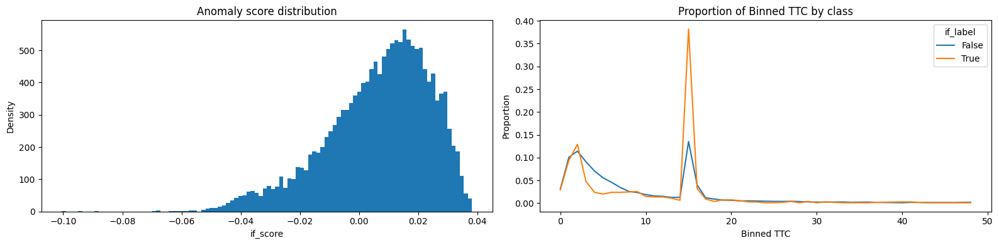

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

fig, axes = plt.subplots(1, 2, figsize=(16, 4))

dfml['if_score'].plot(kind='hist', ax=axes[0], color='C0', linewidth=2,bins=100)
axes[0].set_title('Anomaly score distribution')
axes[0].set_xlabel('if_score')
axes[0].set_ylabel('Density')

binned_ttc = (
    dfml.groupby(IF_LABEL)[BINNED_TTC]
    .value_counts(normalize=True)
    .reset_index(name='proportion')
    .pivot_table(values='proportion', columns=IF_LABEL, index=BINNED_TTC)
    .head(50)
    .dropna()
)
binned_ttc.plot(ax=axes[1], color=['C0', 'C1'], stacked=False)
axes[1].set_title('Proportion of Binned TTC by class')
axes[1].set_xlabel('Binned TTC')
axes[1].set_ylabel('Proportion')

# Show the plots
plt.tight_layout()
plt.show()


In [ ]:
dfml[IF_LABEL] = dfml['if_score']<dfml['if_score'].quantile([.07]).values[0]

In [5]:
dfml.to_json('datasets/dfml.json')

In [11]:
covariates = [REGION , DEVICE , BROWSER , HOUROFDAY , SAFE_SEARCH,CTCODE_PRC , META_ADX , META_OM , META_SLD, META_R, LENQ,DOMAIN_COUNT ,BASELINE_LABEL ,PVAL_QUERY ]


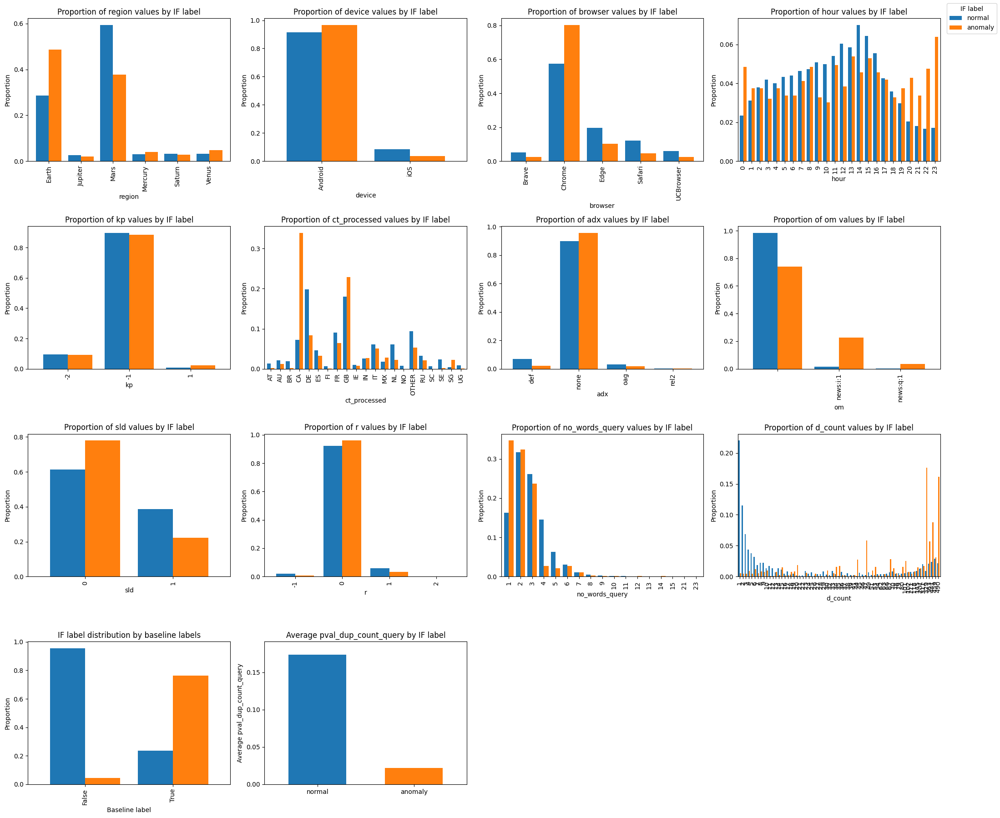

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

fig, axes = plt.subplots(4, 4, figsize=(22, 18))
axes = axes.flatten()

for i, (ax, cov) in enumerate(zip(axes, covariates)): 
    if cov in (PVAL_QUERY, DELTA_DENSITY_TTC):
        m = dfml.groupby(IF_LABEL)[cov].mean()
        m.index = ['normal','anomaly']
        m.plot(kind='bar', ax=ax, color=['C0','C1'], legend=False, width=0.6)
        ax.set_ylabel(f'Average {cov}')
        ax.set_ylim(0, m.max()*1.1)
        ax.set_xticklabels(m.index, rotation=0)
        ax.set_title(f'Average {cov} by IF label')

    elif cov == BASELINE_LABEL:
        df_prop = (
            dfml
            .groupby(BASELINE_LABEL)[IF_LABEL]
            .value_counts(normalize=True)
            .rename('proportion')
            .reset_index()
        )
        pivot = df_prop.pivot(index=BASELINE_LABEL, columns=IF_LABEL, values='proportion')
        pivot.columns = ['normal','anomaly']
        pivot = pivot.sort_index()
        pivot.plot(
            kind='bar', ax=ax,
            color=['C0','C1'], legend=False, width=0.8
        )
        ax.set_ylabel('Proportion')
        ax.set_xlabel('Baseline label')
        ax.set_title('IF label distribution by baseline labels')

    else:
        pct = pd.crosstab(dfml[cov], dfml[IF_LABEL], normalize='columns')
        pct.columns = ['normal','anomaly']
        pct = pct.sort_index()
        pct.plot(
            kind='bar', ax=ax,
            color=['C0','C1'], legend=False, width=0.8
        )
        ax.set_ylabel('Proportion')
        ax.set_xlabel(cov)
        ax.set_title(f'Proportion of {cov} values by IF label')

for ax in axes[len(covariates):]:
    ax.axis('off')

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='upper right', title='IF label')

plt.rcParams.update({'axes.labelsize': 18, 'xtick.labelsize': 18, 'ytick.labelsize': 18})

plt.tight_layout(rect=[0,0,0.95,1])
plt.show()


### Explainability

In [116]:
dfml.columns

Index(['binned_ttc', 'expected_density', 'actual_density',
       'delta_density_ttc_bin', 'date', 'region', 'browser', 'device', 'hour',
       'n', 'f', 'd', 'sld', 'st', 'nt', 'r', 'adx', 'adx_name', 'ttc', 'q',
       'ct', 'kl', 'kp', 'lsexp1', 'bkl', 'om', 'atb', 'va', 'atbva', 'atbexp',
       'ct_processed', 'kl_processed', 'no_words_query', 'q_count', 'd_count',
       'bkl_processed', 'processed_no_words_query', 'pval_dup_count_query',
       'baseline_label', 'encoded_ct_count', 'encoded_sld_count',
       'encoded_nt_count', 'encoded_r_count', 'encoded_adx_count',
       'encoded_binned_ttc_count', 'encoded_kp_count', 'encoded_kl_count',
       'encoded_region_count', 'encoded_bkl_count', 'encoded_om_count',
       'if_score', 'if_label'],
      dtype='object')

In [120]:

from umap.umap_ import UMAP
import plotly.express as px
reducer = UMAP(n_components=2, random_state=42, metric='cosine')
embedding = reducer.fit_transform(dfml[[
        #PVAL_QUERY,DELTA_DENSITY_TTC,
        QUERY_COUNT , DOMAIN_COUNT , 'encoded_ct_count', 'encoded_sld_count',
       'encoded_nt_count', 'encoded_r_count', 'encoded_adx_count',
       'encoded_binned_ttc_count', 'encoded_kp_count', 'encoded_kl_count',
       'encoded_region_count', 'encoded_bkl_count', 'encoded_om_count','actual_density',
        HOUROFDAY , LENQ,
    ]].values.reshape(len(df),-1))
dfml['umap_x'], dfml['umap_y'] = embedding[:, 0], embedding[:, 1]

fig = px.scatter(
    dfml,
    x    = 'umap_x',
    y    = 'umap_y',
    color= 'if_score',
    hover_data=['date', 'region', 'browser', 'device', 'hour',
       'n', 'f', 'd', 'sld', 'st', 'nt', 'r', 'adx', 'adx_name', 'ttc', 'q',
       'ct', 'kl', 'kp', 'lsexp1', 'bkl', 'om', 'atb', 'va', 'atbva', 'atbexp','if_label','if_score','baseline_label'],
    title= '2D UMAP Projection',
    width= 1200, height=600
)
fig.show()


/usr/local/lib/python3.11/site-packages/sklearn/utils/deprecation.py:151: FutureWarning:

'force_all_finite' was renamed to 'ensure_all_finite' in 1.6 and will be removed in 1.8.

/usr/local/lib/python3.11/site-packages/umap/umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



In [123]:
fig.write_html("embedding_space.html")

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(preprocessed[FEATURES].copy())

In [136]:
dfml[dfml[BASELINE_LABEL]==True][IF_LABEL].value_counts(normalize=True)

if_label
True     0.762712
False    0.237288
Name: proportion, dtype: float64

In [141]:
dfml.groupby(BASELINE_LABEL)[IF_LABEL].value_counts(normalize=True).reset_index().pivot_table(columns=(IF_LABEL),values=['proportion'],index=BASELINE_LABEL)

proportion          
if_label            False     True 
baseline_label                     
False            0.954350  0.045650
True             0.237288  0.762712

### Filters

In [ ]:
import shap

features = [
    PVAL_QUERY, DELTA_DENSITY_TTC,
    QUERY_COUNT, DOMAIN_COUNT, 'encoded_binned_ttc_count', 'encoded_kp_count', 
    'encoded_region_count', 'encoded_bkl_count', 'encoded_om_count',
    HOUROFDAY, LENQ,
]


explainer = shap.Explainer(if2.decision_function, dfml[features].sample(1000,random_state=42))
shap_values = explainer.shap_values(dfml[features])

shap_df = pd.DataFrame(shap_values, columns=features)
shap_df.to_json('datasets/shap_df.json')

PermutationExplainer explainer:   9%|▊         | 1332/15624 [12:01<3:06:35,  1.28it/s]

In [ ]:

dftree = dfml.copy()

IS_QUERY_DUP='duplicated_query'
IS_DOMAIN_DUP = 'duplicated_domain'
dftree[IS_QUERY_DUP] = dftree[QUERY_COUNT]>1
dftree[IS_DOMAIN_DUP] = dftree[DOMAIN_COUNT]>1


for col in [BROWSER,DEVICE,REGION,CTCODE_PRC,REGION_DDG_PRC,META_BKL_PRC,SAFE_SEARCH,META_OM]:
    dummies = pd.get_dummies(dftree[col], prefix=f'{col}_is')
    dftree[dummies.columns] = dummies

feature_cols = [IS_DOMAIN_DUP,IS_QUERY_DUP,HOUROFDAY,DELTA_DENSITY_TTC,BINNED_TTC,
    TTC,'browser_is_Brave', 'browser_is_Chrome',
       'browser_is_Edge', 'browser_is_Safari', 'browser_is_UCBrowser',
       'device_is_Android', 'device_is_iOS', 'region_is_Earth',
       'region_is_Jupiter', 'region_is_Mars', 'region_is_Mercury',
       'region_is_Saturn', 'region_is_Venus', 'ct_processed_is_AT',
       'ct_processed_is_AU', 'ct_processed_is_BR', 'ct_processed_is_CA',
       'ct_processed_is_DE', 'ct_processed_is_ES', 'ct_processed_is_FI',
       'ct_processed_is_FR', 'ct_processed_is_GB', 'ct_processed_is_IE',
       'ct_processed_is_IN', 'ct_processed_is_IT', 'ct_processed_is_MX',
       'ct_processed_is_NL', 'ct_processed_is_NO',
       'ct_processed_is_OTHER', 'ct_processed_is_RU',
       'ct_processed_is_SC', 'ct_processed_is_SE', 'ct_processed_is_SG',
       'ct_processed_is_UG', 'kl_processed_is_OTHER',
       'kl_processed_is_at-de', 'kl_processed_is_br-pt',
       'kl_processed_is_ca-en', 'kl_processed_is_ca-fr',
       'kl_processed_is_de-de', 'kl_processed_is_dk-da',
       'kl_processed_is_es-es', 'kl_processed_is_fi-fi',
       'kl_processed_is_fr-fr', 'kl_processed_is_in-en',
       'kl_processed_is_it-it', 'kl_processed_is_mx-es',
       'kl_processed_is_nl-nl', 'kl_processed_is_no-no',
       'kl_processed_is_se-sv', 'kl_processed_is_sg-en',
       'kl_processed_is_uk-en', 'kl_processed_is_us-en',
       'kl_processed_is_wt-wt', 'bkl_processed_is_OTHER',
     'bkl_processed_is_r1-115',
       'bkl_processed_is_r1-13', 'bkl_processed_is_r1-17',
       'bkl_processed_is_r1-18', 'bkl_processed_is_r1-32',
       'bkl_processed_is_r1-47', 'bkl_processed_is_r1-49',
       'bkl_processed_is_ra-2', 'bkl_processed_is_wikipedia_portuguese',
       
]


In [ ]:
import numpy as np, pandas as pd, matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier, _tree
from matplotlib.table import Cell

#  label anomalies (global p10) ─────────────────────────────
cut = dftree['if_score'].quantile(0.10)                 

# · fit shallow decision tree ───────────────────────────────
clf = DecisionTreeClassifier(max_depth=4,
                             class_weight={0:1, 1:7},
                             random_state=42)
clf.fit(dftree[feature_cols], dftree[IF_LABEL])

leaf_ids = clf.apply(dftree[feature_cols])
_, inv = np.unique(leaf_ids, return_inverse=True)
dftree['rule_id'] = inv + 1

#  · per‑rule p90 & recall share
g = dftree.groupby('rule_id')
summary = pd.DataFrame({
    'p90'         : g['if_score'].quantile(0.90),
    'recall_share': g[IF_LABEL].sum() / dftree[IF_LABEL].sum(),
    'leaf_size'   : g.size()
})

summary = summary[summary.leaf_size >= 30]      # drop small leaves
summary = summary.drop(columns='leaf_size')

leaf_size = dftree.groupby('rule_id').size()
summary = summary.loc[leaf_size[leaf_size >= 30].index]

def leaf_paths(tree, feats):
    out, stack = [], []
    def dfs(node):
        if tree.tree_.feature[node] != _tree.TREE_UNDEFINED:
            f = feats[tree.tree_.feature[node]]
            t = tree.tree_.threshold[node]
            stack.append(f"{f} ≤ {t:.3f}"); dfs(tree.tree_.children_left[node]);  stack.pop()
            stack.append(f"{f} > {t:.3f}");  dfs(tree.tree_.children_right[node]); stack.pop()
        else:
            out.append(" ∧ ".join(stack))
    dfs(0); return out                           

rule_lookup = {i+1: txt for i, txt in enumerate(leaf_paths(clf, feature_cols))}
summary['rule'] = summary.index.map(rule_lookup)

fig = plt.figure(figsize=(18, 4))

ax   = fig.add_subplot(1, 2, 1)
ax_r = ax.twinx()

ax_r.bar(summary.index, summary['recall_share'],
         alpha=.6, color='green', label='share of positives captured')
ax.plot(summary.index, summary['p90'],
        marker='o', lw=2, color='red', label='rule p90')
ax.axhline(cut, color='black', ls='--', label='global p10')

ax.set_xlabel('Rule #')
ax.set_title('Rule purity (p90) and coverage (recall share)')
ax.set_ylabel('Rule p90 (IF score)', color='red');  ax.tick_params(axis='y', labelcolor='red')
ax_r.set_ylabel('Recall share',        color='green'); ax_r.tick_params(axis='y', labelcolor='green')
ax.set_xticks(summary.index)

handles, labels = ax.get_legend_handles_labels()
h2, l2 = ax_r.get_legend_handles_labels()
ax.legend(handles+h2, labels+l2, loc='upper center', fontsize=9)


Cell.PAD = 0.01
ax_t = fig.add_subplot(1, 2, 2);  ax_t.axis('off')
tbl = ax_t.table(cellText=[[i, txt] for i, txt in summary['rule'].items()],
                 colLabels=['Rule #', 'Definition'],
                 colWidths=[0.07, 0.93], cellLoc='left', loc='center')
tbl.auto_set_font_size(False); tbl.set_fontsize(10); tbl.scale(1.4, 1.6)

plt.tight_layout()
plt.show()


In [ ]:
dftree[(dftree.rule_id==15)|(dftree[BASELINE_LABEL])][IF_LABEL].sum()/dftree[IF_LABEL].sum()

In [ ]:
dftree[(dftree.rule_id==15)][IF_LABEL].sum()/dftree[IF_LABEL].sum()

### Probability calibration

In [3]:
dfml = pd.read_json('datasets/dfml.json'
)

KDE avg log‑likelihood: 2.499
GPD KS-test: D=0.047, p-value=0.337


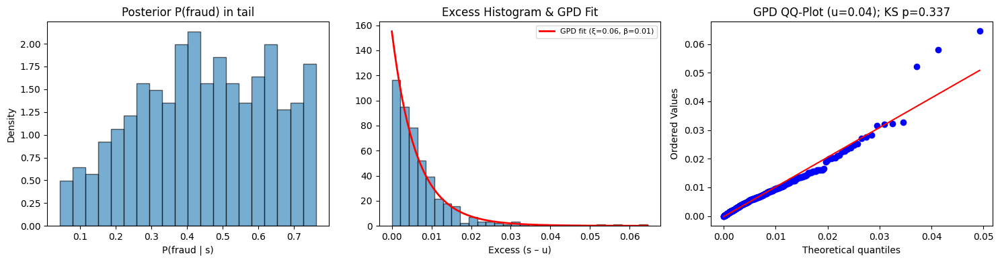

In [4]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.stats import genpareto, kstest, probplot
from sklearn.neighbors import KernelDensity

# === 1) Percentile‐rank risk score ===
dfml['pct_rank'] = dfml['if_score'].rank(pct=True)

# === 2) Bayesian setup ===
# We want P(fraud | score) = [P(score | fraud) * P(fraud)] / P(score)
# - P(score) from KDE gives a smooth estimate of the marginal density p(s)
# - P(fraud) is set to 0.02 (business prior)
# - P(score | fraud) approx = P(score | score > u) modeled by GPD for tail

p_fraud = 0.02  # prior probability of fraud

# === 3) Prepare scores ===
# Invert IF score: higher = more anomalous
scores = -dfml['if_score'].values.reshape(-1, 1)

# === 4) Fit p(s) via KDE 
kde = KernelDensity(bandwidth=0.02).fit(scores)
logdens = kde.score_samples(scores)        
avg_ll = np.mean(logdens)
print(f"KDE avg log‑likelihood: {avg_ll:.3f}")

# === 5) Fit GPD to tail for P(score | fraud) ===
# Use 97.5th percentile as threshold (u) satifying the signficiance threshold for goodness of fit KStest
u = np.percentile(scores, 97.5)
excess = (scores[scores.flatten() > u] - u).flatten()

# Fit GPD on excesses (location=0)
xi, _, beta = genpareto.fit(excess, floc=0)

# Goodness‑of‑fit via KS test
D, pval = kstest(excess, 'genpareto', args=(xi, 0, beta))
print(f"GPD KS-test: D={D:.3f}, p-value={pval:.3f}")

# === 6) Compute posterior P(fraud | s) ===
dens_all = np.exp(logdens)                        # p(s)
dens_tail = np.where(scores.flatten() > u,
                     genpareto.pdf(scores.flatten() - u, c=xi, scale=beta),
                     0)
posterior = p_fraud * dens_tail / dens_all        # Bayes update
dfml['p_fraud_gpd'] = posterior                   

tail_mask = scores.flatten() > u
tail_post = posterior[tail_mask]

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

# (a) Posterior distribution in the tail region
axs[0].hist(tail_post, bins=20, density=True, alpha=0.6, edgecolor='k')
axs[0].set_title('Posterior P(fraud) in tail')
axs[0].set_xlabel('P(fraud | s)')
axs[0].set_ylabel('Density')

# (b) Excess histogram vs. GPD fit
axs[1].hist(excess, bins=30, density=True, alpha=0.6, edgecolor='k')
x = np.linspace(0, excess.max(), 200)
axs[1].plot(x, genpareto.pdf(x, c=xi, scale=beta), 'r-', lw=2,
            label=f'GPD fit (ξ={xi:.2f}, β={beta:.2f})')
axs[1].set_title('Excess Histogram & GPD Fit')
axs[1].set_xlabel('Excess (s – u)')
axs[1].legend(fontsize=8)

# (c) QQ‑plot 
probplot(excess, dist="genpareto", sparams=(xi, 0, beta), plot=axs[2])
axs[2].set_title(f'GPD QQ‑Plot (u={u:.2f}); KS p={pval:.3f}')

plt.tight_layout()
plt.show()


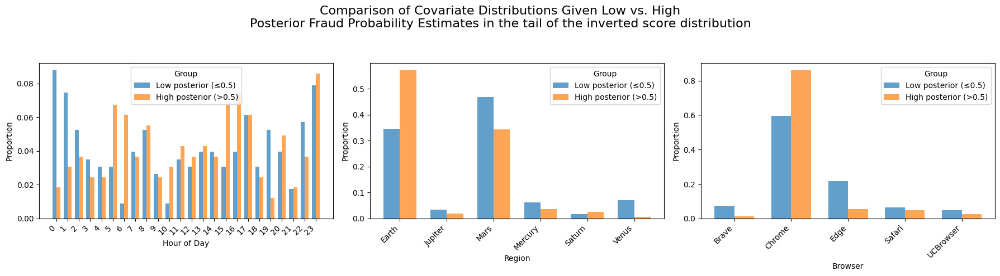

In [12]:
import numpy as np
import matplotlib.pyplot as plt

covariates = [HOUROFDAY, REGION, BROWSER]

display_names = {
    HOUROFDAY: 'Hour of Day',
    REGION:    'Region',
    BROWSER:   'Browser'
}

low_mask  = np.logical_and(dfml['p_fraud_gpd'] <= 0.5,dfml['p_fraud_gpd'] >.01)
high_mask = dfml['p_fraud_gpd']  > 0.5

fig, axes = plt.subplots(1, 3, figsize=(18, 5), sharey=False)
fig.suptitle(
    'Comparison of Covariate Distributions Given Low vs. High\n'
    'Posterior Fraud Probability Estimates in the tail of the inverted score distribution',
    fontsize=16
)

for ax, cov in zip(axes, covariates):
    cnt_low  = dfml.loc[low_mask, cov].value_counts(normalize=True).sort_index()
    cnt_high = dfml.loc[high_mask, cov].value_counts(normalize=True).sort_index()
    idx = cnt_low.index.union(cnt_high.index)
    cnt_low  = cnt_low.reindex(idx, fill_value=0)
    cnt_high = cnt_high.reindex(idx, fill_value=0)
    
    x = np.arange(len(idx))
    width = 0.35
    
    ax.bar(x - width/2, cnt_low,  width, label='Low posterior (≤0.5)', alpha=0.7)
    ax.bar(x + width/2, cnt_high, width, label='High posterior (>0.5)', alpha=0.7)
    
    ax.set_xticks(x)
    ax.set_xticklabels(idx, rotation=45, ha='right')
    ax.set_xlabel(display_names[cov])
    ax.set_ylabel('Proportion')
    ax.legend(title='Group')

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


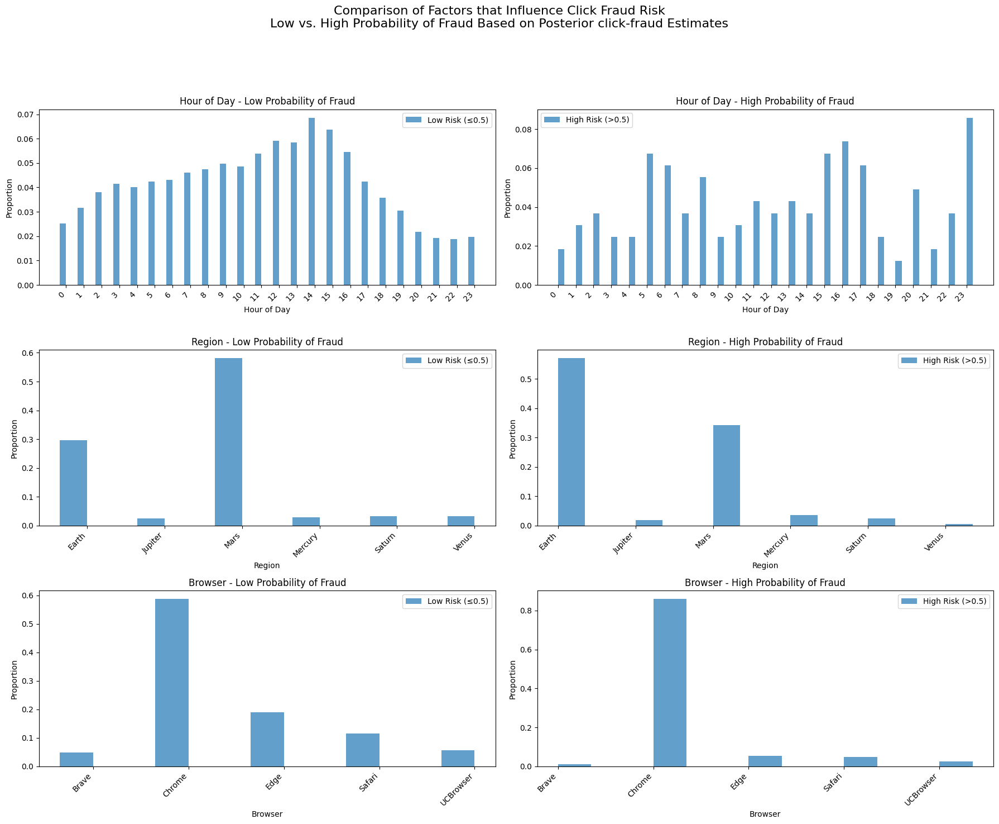

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

covariates = [HOUROFDAY, REGION, BROWSER]

display_names = {
    HOUROFDAY: 'Hour of Day',
    REGION:    'Region',
    BROWSER:   'Browser'
}

low_mask  = dfml['p_fraud_gpd'] <= 0.5
high_mask = dfml['p_fraud_gpd']  > 0.5

fig, axes = plt.subplots(3, 2, figsize=(18, 15), sharey=False)
fig.suptitle(
    'Comparison of Factors that Influence Click Fraud Risk\n'
    'Low vs. High Probability of Fraud Based on Posterior click-fraud Estimates',
    fontsize=16
)

for i, cov in enumerate(covariates):
    cnt_low  = dfml.loc[low_mask, cov].value_counts(normalize=True).sort_index()
    cnt_high = dfml.loc[high_mask, cov].value_counts(normalize=True).sort_index()

    idx = cnt_low.index.union(cnt_high.index)
    cnt_low  = cnt_low.reindex(idx, fill_value=0)
    cnt_high = cnt_high.reindex(idx, fill_value=0)
    
    x = np.arange(len(idx))
    width = 0.35
    
    axes[i, 0].bar(x - width/2, cnt_low,  width, label='Low Risk (≤0.5)', alpha=0.7)
    axes[i, 0].set_xticks(x)
    axes[i, 0].set_xticklabels(idx, rotation=45, ha='right')
    axes[i, 0].set_xlabel(display_names[cov])
    axes[i, 0].set_ylabel('Proportion')
    axes[i, 0].set_title(f'{display_names[cov]} - Low Probability of Fraud')
    axes[i, 0].legend()

    axes[i, 1].bar(x + width/2, cnt_high, width, label='High Risk (>0.5)', alpha=0.7)
    axes[i, 1].set_xticks(x)
    axes[i, 1].set_xticklabels(idx, rotation=45, ha='right')
    axes[i, 1].set_xlabel(display_names[cov])
    axes[i, 1].set_ylabel('Proportion')
    axes[i, 1].set_title(f'{display_names[cov]} - High Probability of Fraud')
    axes[i, 1].legend()

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


In [9]:
dfml[low_mask].p_fraud_gpd.max()

0.4954129374768404

In [ ]:

from umap.umap_ import UMAP
import plotly.express as px

reducer = UMAP(n_components=2, random_state=42, metric='cosine')
embedding = reducer.fit_transform(dfml[[
        QUERY_COUNT , DOMAIN_COUNT , 'encoded_ct_count', 'encoded_sld_count',
       'encoded_nt_count', 'encoded_r_count', 'encoded_adx_count',
       'encoded_binned_ttc_count', 'encoded_kp_count', 'encoded_kl_count',
       'encoded_region_count', 'encoded_bkl_count', 'encoded_om_count','actual_density',
        HOUROFDAY , LENQ,
    ]].values.reshape(len(df),-1))
dfml['umap_x'], dfml['umap_y'] = embedding[:, 0], embedding[:, 1]



dfml['marker_size'] = np.where(dfml['p_fraud_gpd'] > 0, 12, 1)

fig = px.scatter(
    dfml,
    x='umap_x',
    y='umap_y',
    color='p_fraud_gpd',
    size='marker_size',        
    size_max=13,               
    hover_data=['p_fraud_gpd', 'if_score'],
    title='2D UMAP Projection',
    width=1200, height=600
)

fig.update_traces(marker=dict(opacity=0.8))  
fig.show()

